<a href="https://colab.research.google.com/github/Imtiaj-Sajin/brain/blob/main/brain_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

dir = '/content/drive/MyDrive/ds004196'

files = os.listdir(dir)

for file in files:
    print(file)


.gitattributes
README
dataset_description.json
participants.tsv
CHANGES
participants.json
sub-02
sub-03
.datalad
sub-01
.git
sub-05
preprocessed_eeg
eeg_preprocessed_v2
trainable


In [ ]:
import os

def print_directory(folder_path, indent=""):
    files_and_folders = [item for item in os.listdir(folder_path) if not item.startswith('.')]

    for index, item in enumerate(files_and_folders):
        is_last = (index == len(files_and_folders) - 1)

        if is_last:
            prefix = "└── "
            next_indent = indent + "    "
        else:
            prefix = "├── "
            next_indent = indent + "│   "

        print(f"{indent}{prefix}{item}")

        item_path = os.path.join(folder_path, item)
        if os.path.isdir(item_path):
            print_directory(item_path, next_indent)

folder_path = '/content/drive/MyDrive/ds004196'

print_directory(folder_path)


├── README
├── dataset_description.json
├── participants.tsv
├── CHANGES
├── participants.json
├── sub-02
│   ├── ses-02
│   │   ├── fmap
│   │   │   ├── sub-02_ses-02_magnitude2.nii.gz
│   │   │   ├── sub-02_ses-02_phasediff.nii.gz
│   │   │   ├── sub-02_ses-02_magnitude2.json
│   │   │   ├── sub-02_ses-02_magnitude1.json
│   │   │   ├── sub-02_ses-02_magnitude1.nii.gz
│   │   │   └── sub-02_ses-02_phasediff.json
│   │   └── func
│   │       ├── sub-02_ses-02_task-inner_events.tsv
│   │       ├── sub-02_ses-02_task-inner_events.json
│   │       ├── sub-02_ses-02_task-inner_bold.json
│   │       └── sub-02_ses-02_task-inner_bold.nii.gz
│   ├── ses-EEG
│   │   └── eeg
│   │       ├── sub-02_ses-EEG_task-inner_channels.tsv
│   │       ├── sub-02_ses-EEG_task-inner_events.tsv
│   │       ├── sub-02_ses-EEG_task-inner_eeg.json
│   │       ├── sub-02_ses-EEG_task-inner_eeg.bdf
│   │       └── sub-02_ses-EEG_task-inner_eeg.set
│   └── ses-01
│       ├── fmap
│       │   ├── sub-02_ses-01_pha

# **Key components of this dataset:**



**README, CHANGES:** Descriptive and change log files for the dataset.
dataset_description.json: Provides metadata about the dataset.
participants.tsv, participants.json: Information about the participants in the study.

**Subfolders (sub-01, sub-02, etc.):**

Each subfolder represents data from a participant in the study.
Each participant folder contains multiple sessions (ses-01, ses-02, ses-EEG), each storing different types of imaging or electrophysiological data.

**Session-specific data:**


> 1.   Functional data (func): BOLD fMRI data and related files (e.g., .nii.gz and .json).
2.   Anatomical data (anat): T1-weighted MRI scans.
3. Field maps (fmap): Fieldmap data used for correcting distortions in MRI data.
4. EEG data (eeg): EEG recordings and event files (e.g., .bdf, .tsv).



**Dataset Overview:**
The dataset consists of 1280 trials in each modality (EEG, FMRI). The stimuli contain 8 words, selected from 2 different categories (social, numeric): Social: child, daughter, father, wife Numeric: four, three, ten, six

There are 4 subjects in total: sub-01, sub-02, sub-03, sub-05. Initially, there were 5 participants, however, sub-04 data was rejected due to high fluctuations. Details of valid data are available in the file participants.tsv.\

-----
**Abstract:** The recognition of inner speech, which could give a `voice' to patients that have no ability to speak or move, is a challenge for brain-computer interfaces (BCIs). A shortcoming of the available datasets is that they do not combine modalities to increase the performance of inner speech recognition. Multimodal datasets of brain data enable the fusion of neuroimaging modalities with complimentary properties, such as the high spatial resolution of functional magnetic resonance imaging (fMRI) and the temporal resolution of electroencephalography (EEG), and therefore are promising for decoding inner speech. This paper presents the first publicly available bimodal dataset containing EEG and fMRI data acquired nonsimultaneously during inner-speech production. Data were obtained from four healthy, right-handed participants during an inner-speech task with words in either a social or numerical category. Each of the 8-word stimuli were assessed with 40 trials, resulting in 320 trials in each modality for each participant.
The aim of this work is to provide a publicly available bimodal dataset on inner speech, contributing towards speech prostheses.

---
Code available: https://github.com/LTU-Machine-Learning/Inner_Speech_EEG_FMRI

Publication available: https://www.nature.com/articles/s41597-023-02286-w

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **eeg filee**

In [ ]:
pip install mne


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 48.1 MB/s eta 0:00:00


In [ ]:
!pip install mne scipy


In [ ]:
import pandas as pd

channels_file = '/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_channels.tsv'
channels_data = pd.read_csv(channels_file, sep='\t')

print(channels_data.head())


  name  type  units
0  Fp1   NaN    NaN
1  AF7   NaN    NaN
2  AF3   NaN    NaN
3   F1   NaN    NaN
4   F3   NaN    NaN


In [ ]:
events_file = '/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_events.tsv'
events_data = pd.read_csv(events_file, sep='\t')

events_data


,onset,duration,trial_type
0,0,3999.0,six
1,3999,4000.0,six
2,7999,4000.0,four
3,11999,4000.0,ten
4,15999,4000.0,four
...,...,...,...
314,1256001,4000.0,four
315,1260001,4000.0,four
316,1264001,4000.0,three
317,1268001,4000.0,father


In [ ]:
import json

eeg_json_file = '/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.json'
with open(eeg_json_file, 'r') as f:
    eeg_metadata = json.load(f)

print(json.dumps(eeg_metadata, indent=4))


{
    "SoftwareFilters": {
        "FilterDescription": {
            "Description": "N/A"
        }
    },
    "ManufacturersModelName": "BioSemi Active2",
    "Manufacturer": "BioSemi",
    "EEGPlacementScheme": "10-20",
    "EEGReference": "Cz",
    "CapManufacturer": "BioSemi",
    "InstitutionName": "Lulea University of Technology",
    "TaskName": "Inner Speech",
    "TaskDescription": "Inner Speech recognition using 8 words as stimuli",
    "EEGChannelCount": 64,
    "PowerLineFrequency": 50,
    "RecordingDuration": 1360,
    "RecordingType": "continuous",
    "SamplingFrequency": 512,
    "EOGChannelCount": 4,
    "ECGChannelCount": 0,
    "EMGChannelCount": 0
}


Extracting EDF parameters from /content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 696319  =      0.000 ...  1359.998 secs...


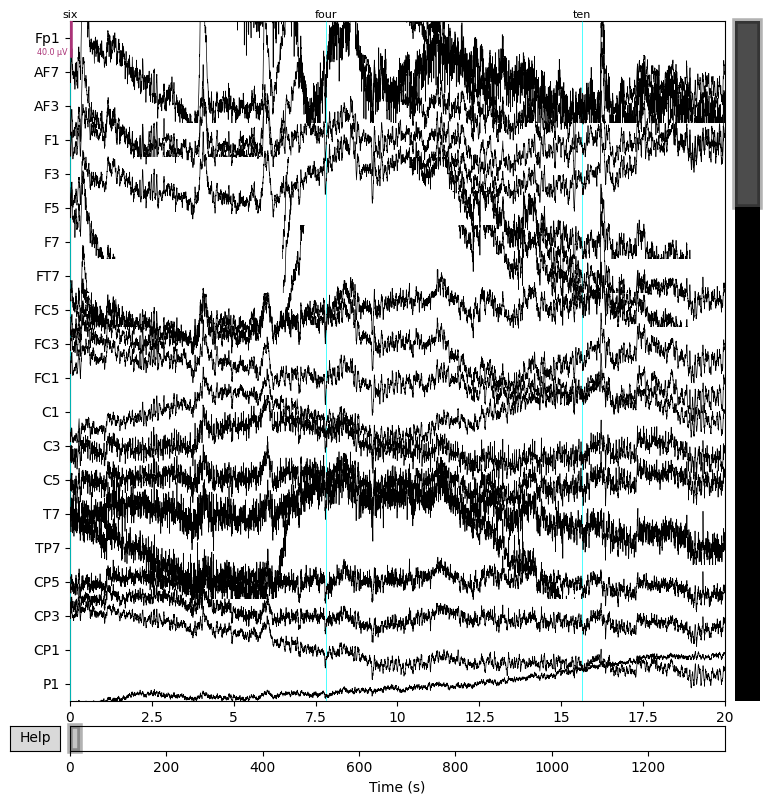

In [ ]:
import mne
mne.viz.set_browser_backend('matplotlib')

bdf_file = '/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf'

raw = mne.io.read_raw_bdf(bdf_file, preload=True)

events_data = pd.read_csv('/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_events.tsv', sep='\t')

# Convert the onset to sample points (based on the sampling frequency of 512 Hz)
events = np.array([
    [int(row['onset']), 0, idx+1] for idx, row in events_data.iterrows()
])

# Create MNE-compatible event array
event_id = {trial: idx+1 for idx, trial in enumerate(events_data['trial_type'].unique())}

# Plot the raw EEG data with events
fig = raw.plot(events=events, event_id=event_id, start=0, duration=20)


Extracting EDF parameters from /content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 696319  =      0.000 ...  1359.998 secs...


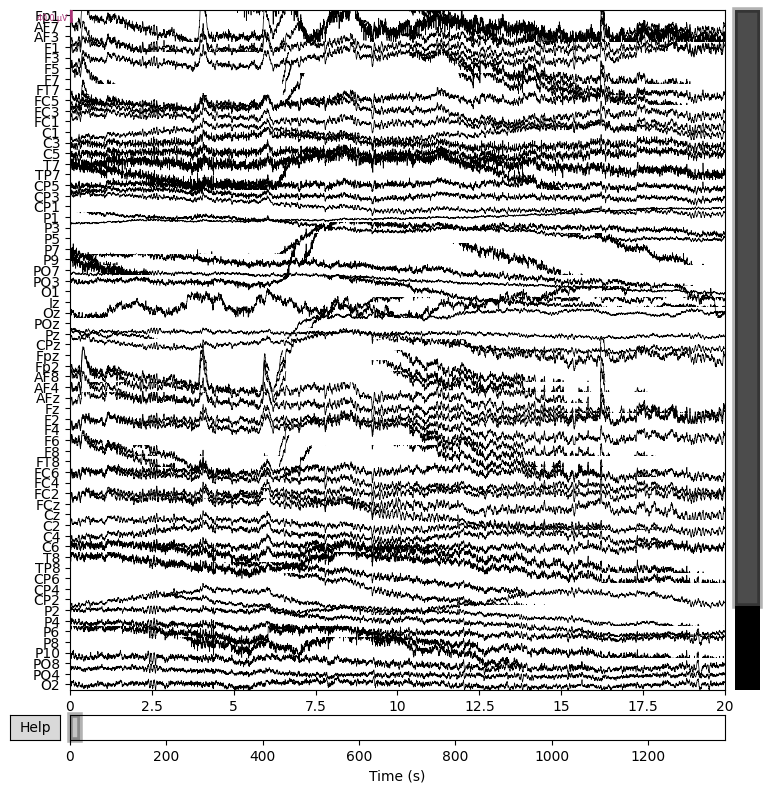

In [ ]:
import mne

file_path = '/content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf'

raw1 = mne.io.read_raw_bdf(file_path, preload=True)

fig = raw1.plot(duration=20, n_channels=64)


In [ ]:
print(raw.info['ch_names'])


['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7', 'EXG8', 'Status']


In [ ]:
print(raw.info['nchan'])
print(raw1.info['nchan'])


73
73


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


<ipython-input-50-d10e8cef8d5d>:2: RuntimeWarning:

Channel locations not available. Disabling spatial colors.



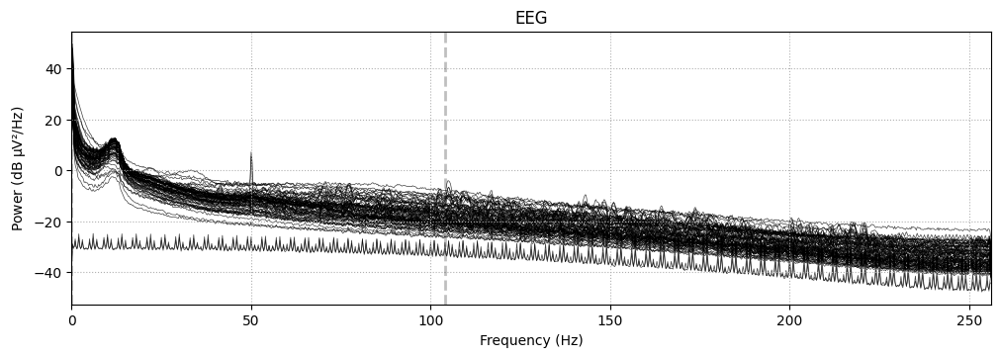

In [ ]:
# Plot the power spectral density (PSD)
fig=raw.plot_psd(fmax=256)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    5.2s


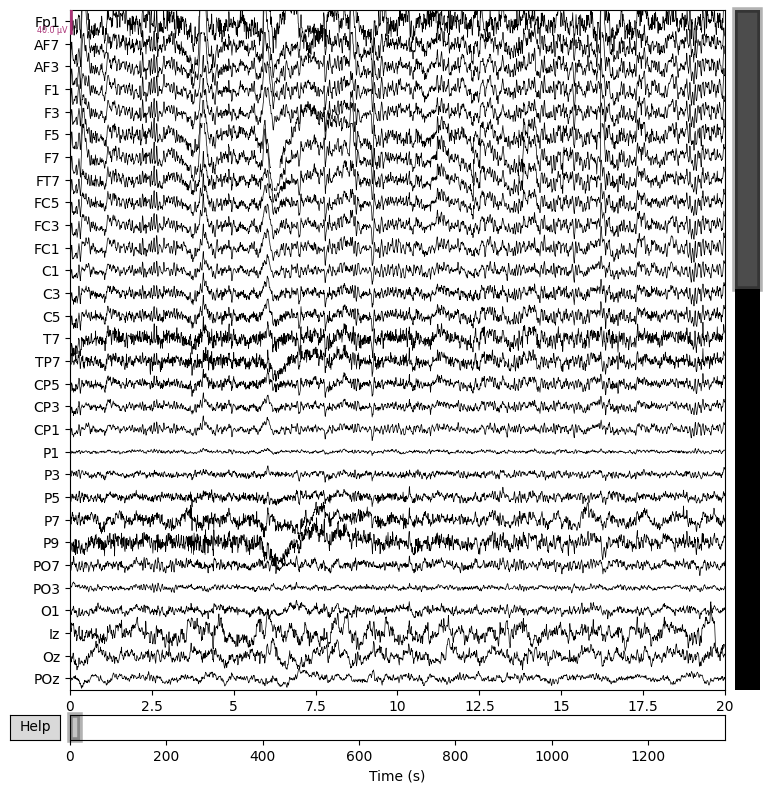

In [ ]:
# Apply a bandpass filter from 1 to 40 Hz
raw_filtered = raw1.copy().filter(l_freq=1, h_freq=40)

fig=raw_filtered.plot(duration=20, n_channels=30)


In [ ]:
raw.save('eeg_data-raw.fif', overwrite=True)


Writing /content/eeg_data-raw.fif
Closing /content/eeg_data-raw.fif
[done]


<Figure size 640x480 with 0 Axes>

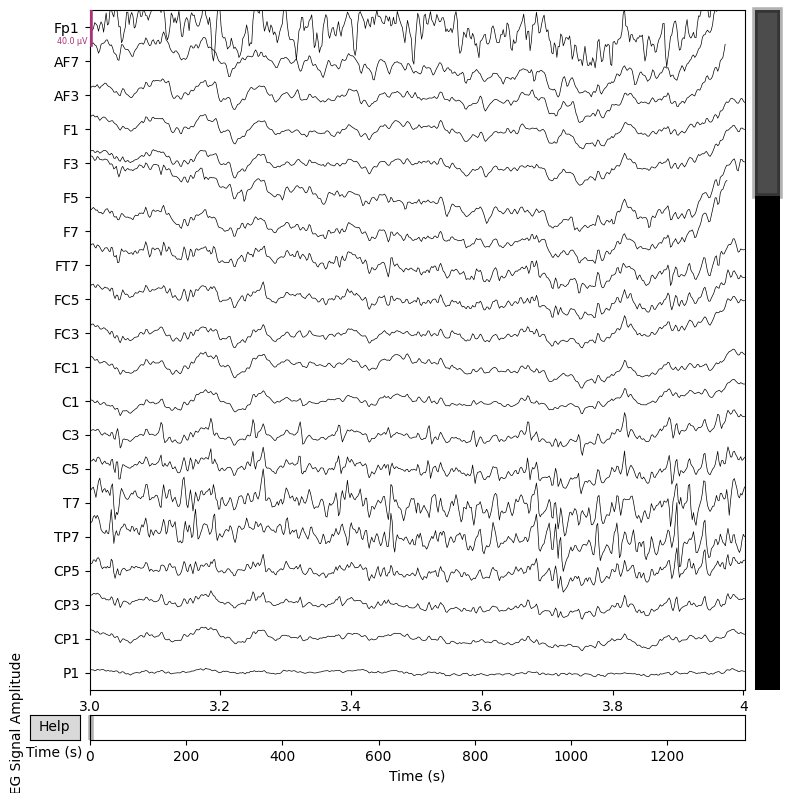

<Figure size 640x480 with 0 Axes>

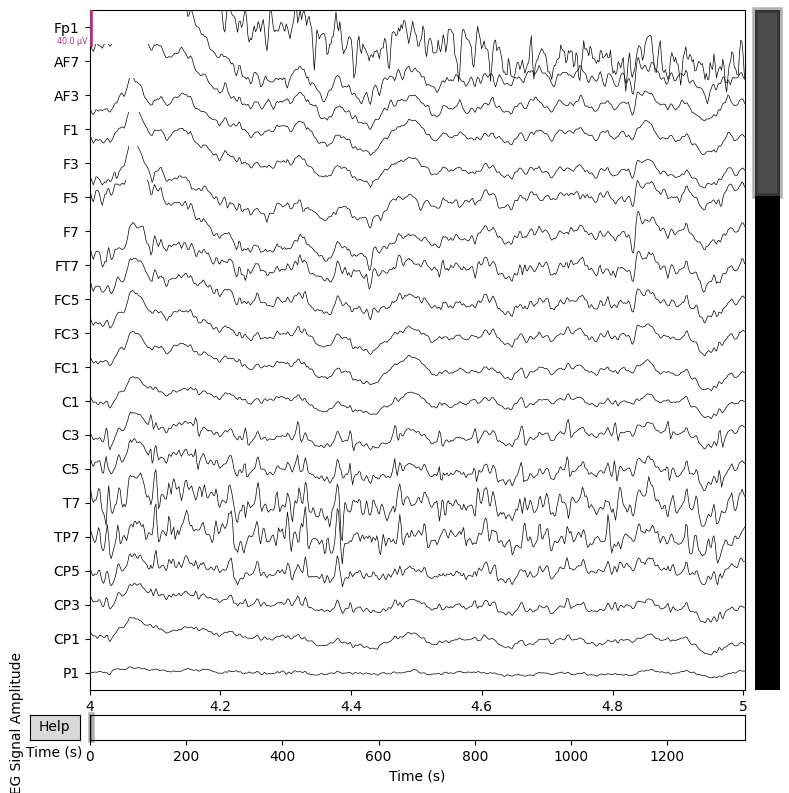

In [ ]:
import matplotlib.pyplot as plt


segments = {
    "six": (3.0, 4.0), #3000ms-4k
    "four": (4.0, 5),
}


for word, (start, end) in segments.items():
    plt.figure()
    raw.plot(start=start, duration=end-start, title=f'EEG Data for "{word}"', show=False)
    plt.xlabel('Time (s)')
    plt.ylabel('EEG Signal Amplitude')
    plt.show()


# **gz File(sub5-ses2-magnitude)**

In [ ]:
eeg_json_file = '/content/drive/MyDrive/ds004196/sub-05/ses-02/fmap/sub-05_ses-02_magnitude1.json'
with open(eeg_json_file, 'r') as f:
    eeg_metadata = json.load(f)

print(json.dumps(eeg_metadata, indent=4))


{
    "Modality": "MR",
    "MagneticFieldStrength": 3,
    "ImagingFrequency": 123.261,
    "Manufacturer": "Siemens",
    "ManufacturersModelName": "Prisma",
    "InstitutionName": "SUBIC",
    "SoftwareVersions": "syngo MR E11",
    "SeriesNumber": 5,
    "AcquisitionTime": "14:09:31.172500",
    "AcquisitionNumber": 1,
    "SliceThickness": 2,
    "SpacingBetweenSlices": 2.5,
    "SAR": 0.114943,
    "EchoNumber": 1,
    "EchoTime": 0.00492,
    "RepetitionTime": 0.662,
    "FlipAngle": 60,
    "PartialFourier": 1,
    "BaseResolution": 64,
    "ShimSetting": [
        -2708,
        -1107,
        1090,
        309,
        103,
        -202,
        -92,
        -17
    ],
    "TxRefAmp": 276.079,
    "PhaseResolution": 1,
    "ReceiveCoilName": "HeadNeck_20",
    "ReceiveCoilActiveElements": "HE1-4",
    "PulseSequenceDetails": "%SiemensSeq%\\gre_field_mapping",
    "CoilCombinationMethod": "Sum of Squares",
    "ConsistencyInfo": "N4_VE11C_LATEST_20160120",
    "MatrixCoilMode"

In [ ]:
pip install nibabel matplotlib nilearn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 49.0 MB/s eta 0:00:00


{'Slice Thickness': 2, 'Spacing Between Slices': 2.5, 'Total Slices': 55}


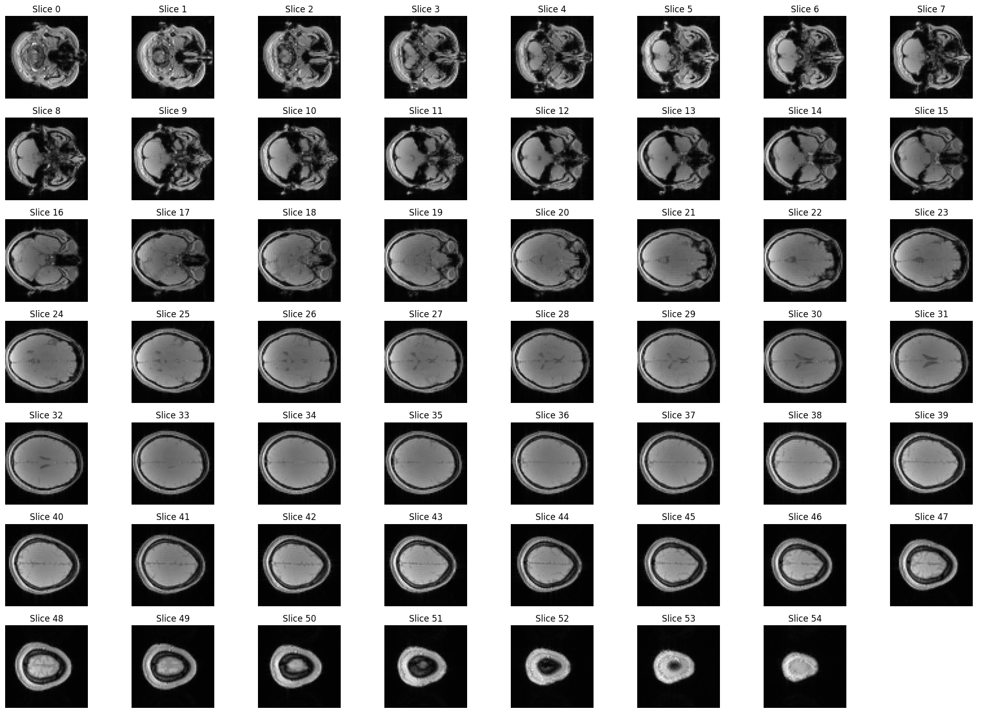

In [ ]:
# Example to adjust the visualization based on metadata

import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# Load the NIfTI file
file_path = '/content/drive/MyDrive/ds004196/sub-05/ses-02/fmap/sub-05_ses-02_magnitude1.nii.gz'
nifti_img = nib.load(file_path)

# Get the image data
img_data = nifti_img.get_fdata()

# Print metadata for reference
metadata = {
    "Slice Thickness": 2,  # From your metadata
    "Spacing Between Slices": 2.5,
    "Total Slices": img_data.shape[2]
}
print(metadata)

# Visualizing slices
num_slices = metadata["Total Slices"]
images_per_row = 8
num_rows = num_slices // images_per_row + (1 if num_slices % images_per_row > 0 else 0)

fig, axs = plt.subplots(num_rows, images_per_row, figsize=(20, num_rows * 2))

for i in range(num_slices):
    ax = axs[i // images_per_row, i % images_per_row]
    ax.imshow(img_data[:, :, i], cmap='gray', origin='lower')
    ax.set_title(f'Slice {i}')
    ax.axis('off')

for j in range(num_slices, num_rows * images_per_row):
    axs[j // images_per_row, j % images_per_row].axis('off')

plt.tight_layout()
plt.show()


<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 59 EEG
 custom_ref_applied: False
 dig: 62 items (3 Cardinal, 59 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 59
 projs: []
 sfreq: 512.0 Hz
>
Using matplotlib as 2D backend.


<ipython-input-5-3024ed271630>:8: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = read_raw_eeglab(file_path, preload=True)
<ipython-input-5-3024ed271630>:8: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = read_raw_eeglab(file_path, preload=True)


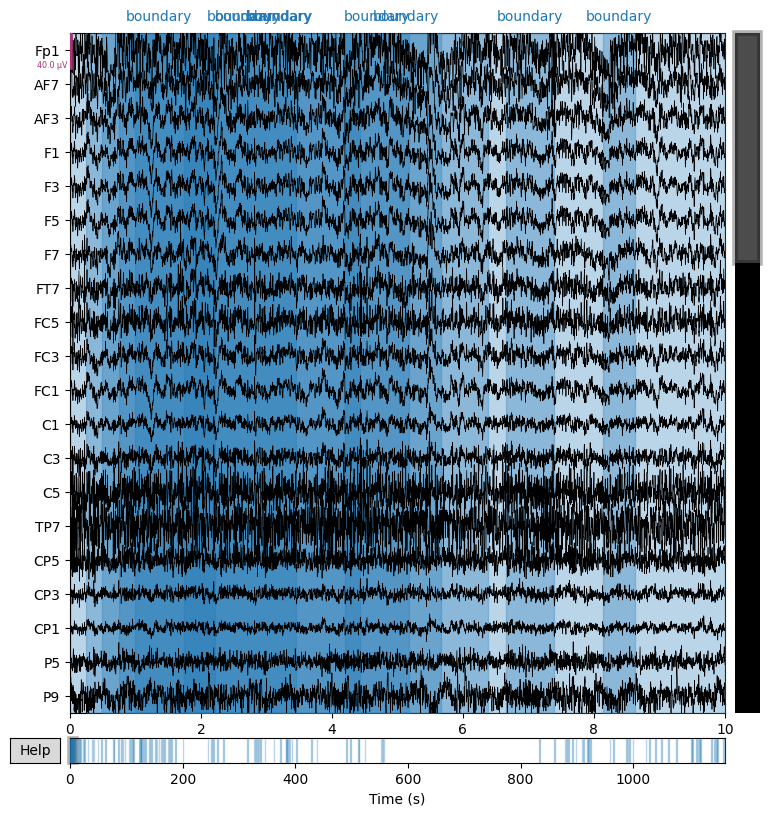

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


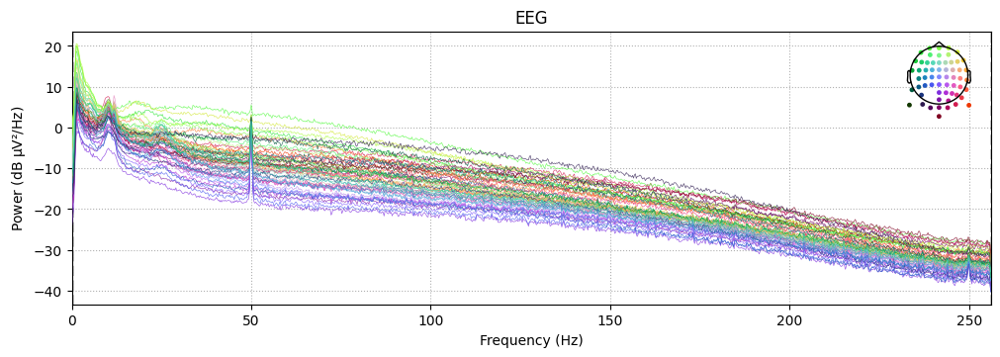

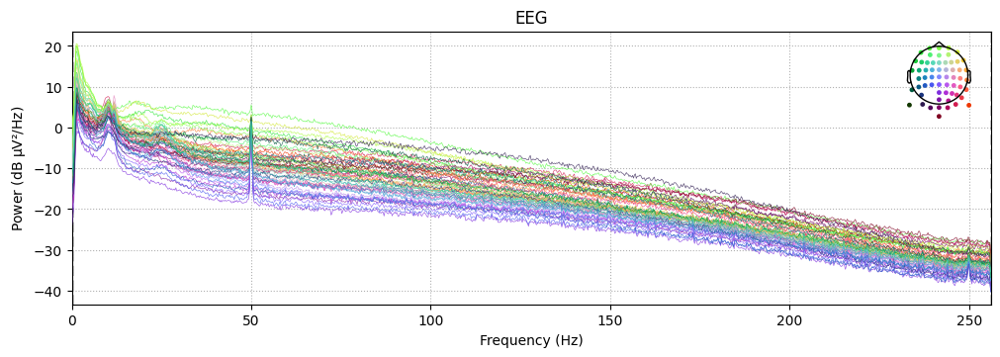

In [ ]:
from mne.io import read_raw_eeglab
import matplotlib.pyplot as plt

# File path to the .set file
file_path = '/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set'

# Load the .set file
raw = read_raw_eeglab(file_path, preload=True)

# Print information about the dataset
print(raw.info)

# Plot the raw EEG data interactively
raw.plot()

# Plot power spectral density to view frequency content
raw.plot_psd()


Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


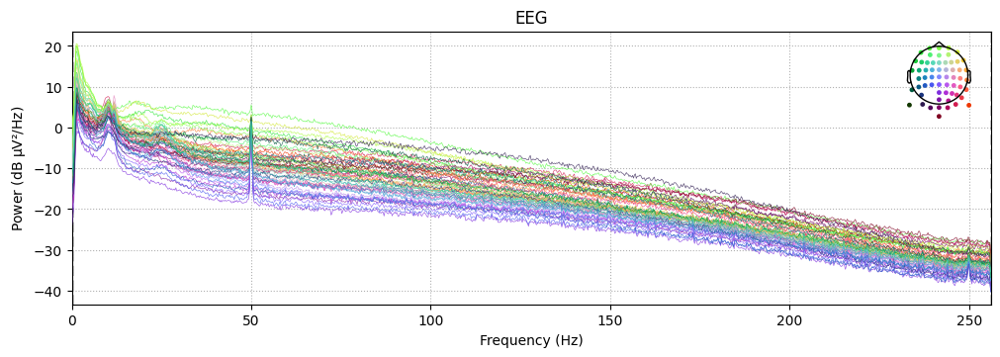

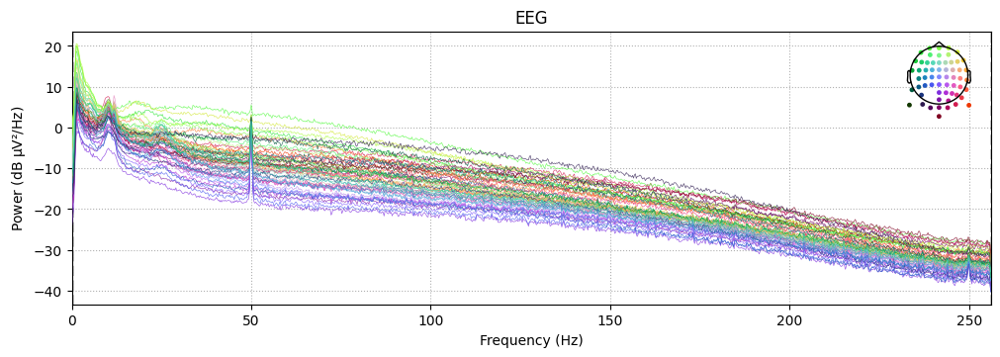

In [ ]:
raw.compute_psd().plot()

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 59 EEG
 custom_ref_applied: False
 dig: 62 items (3 Cardinal, 59 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 59
 projs: []
 sfreq: 512.0 Hz
>
Using matplotlib as 2D backend.


<ipython-input-7-461c884ebd1a>:7: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = read_raw_eeglab(file_path, preload=True)
<ipython-input-7-461c884ebd1a>:7: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = read_raw_eeglab(file_path, preload=True)


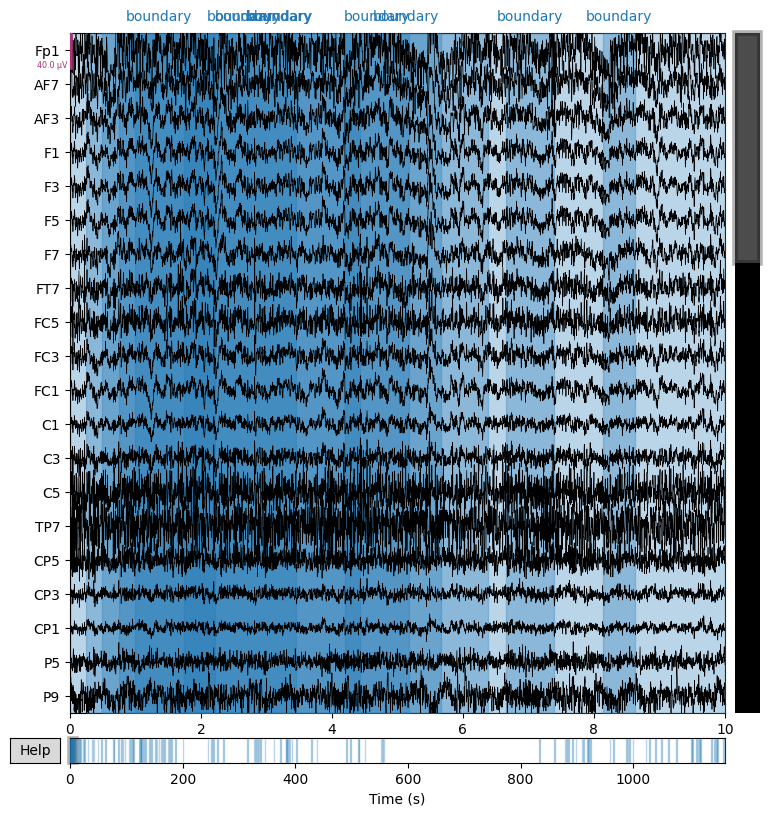

Fitting ICA to data using 59 channels (please be patient, this may take a while)


<ipython-input-7-461c884ebd1a>:17: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 20 components
Fitting ICA took 49.9s.
Writing ICA solution to /content/ica_components.fif...


<ipython-input-7-461c884ebd1a>:20: RuntimeWarning: This filename (ica_components.fif) does not conform to MNE naming conventions. All ICA files should end with -ica.fif, -ica.fif.gz, _ica.fif or _ica.fif.gz
  ica.save('ica_components.fif')


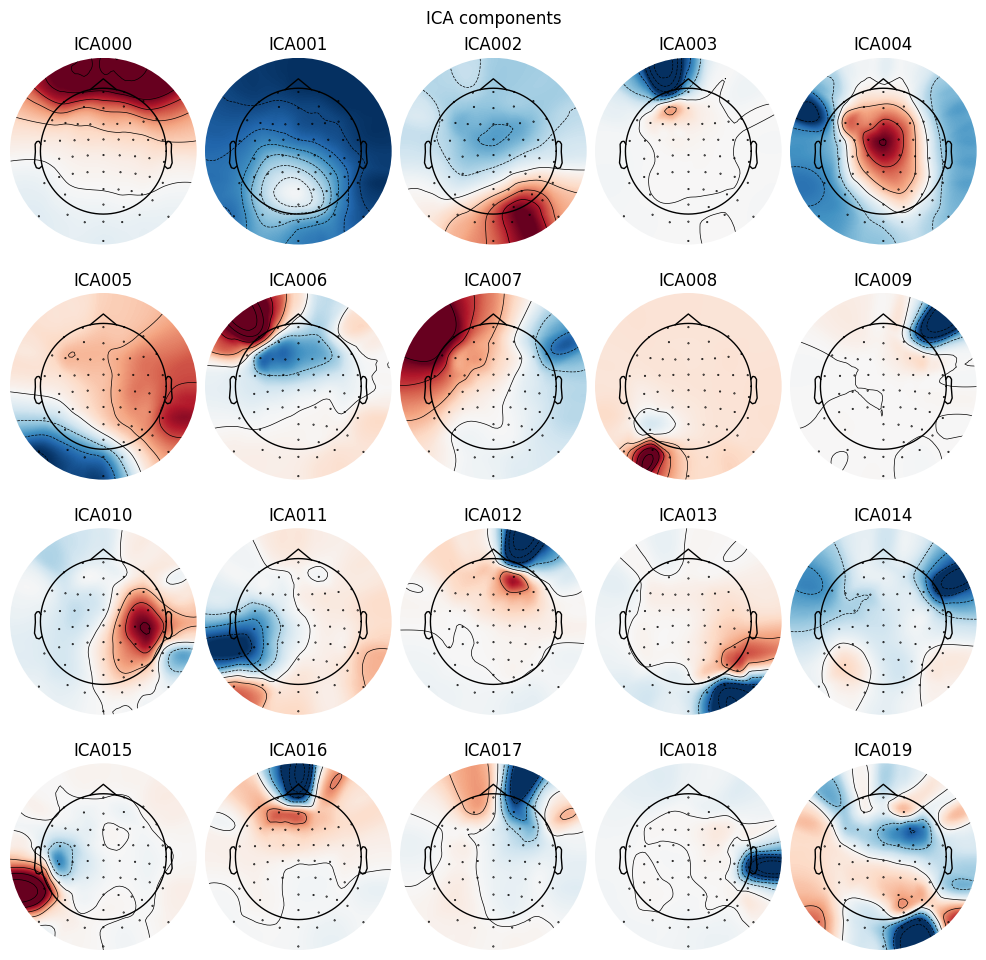

Creating RawArray with float64 data, n_channels=20, n_times=595431
    Range : 0 ... 595430 =      0.000 ...  1162.949 secs
Ready.


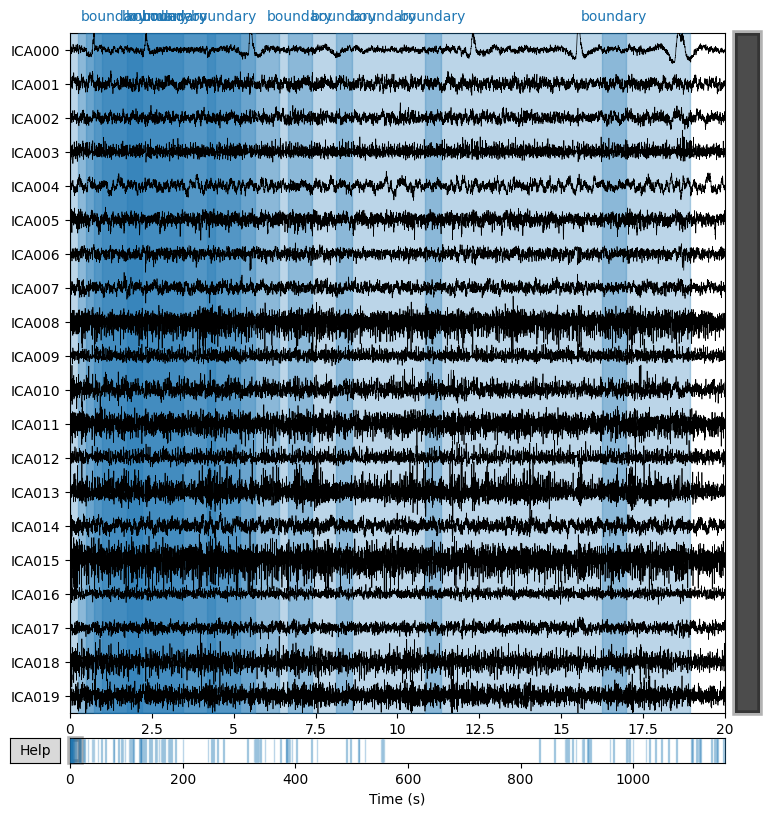

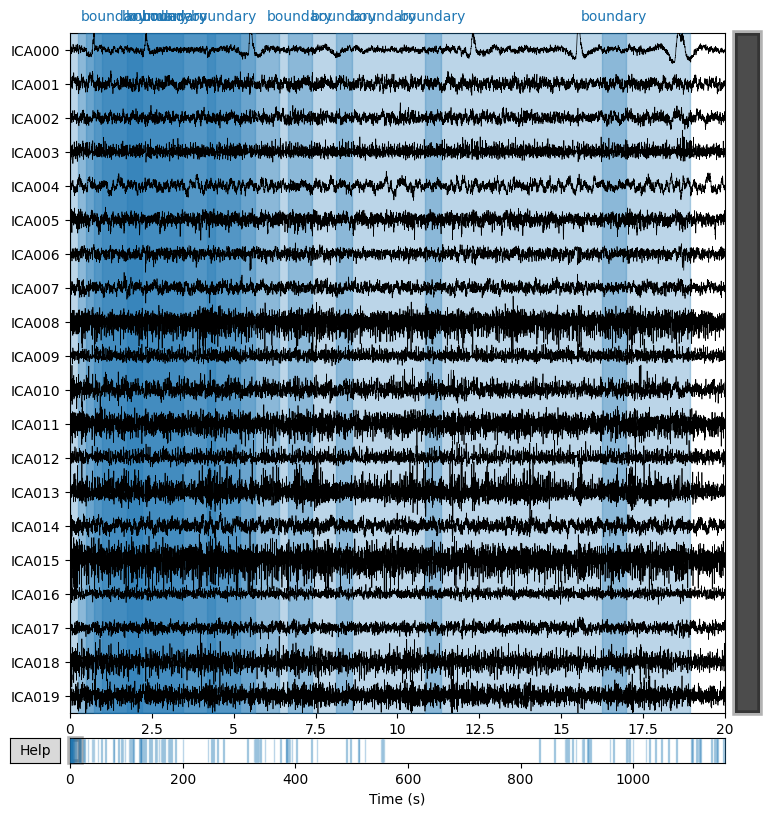

In [ ]:
from mne.io import read_raw_eeglab
from mne.preprocessing import ICA
import matplotlib.pyplot as plt

# Load the .set file
file_path = '/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set'
raw = read_raw_eeglab(file_path, preload=True)

# Print raw info for context
print(raw.info)

# Visualize raw EEG to understand data
raw.plot()

# Compute ICA since we cannot confirm pre-existing components
ica = ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(raw)

# Save ICA object for future use (optional)
ica.save('ica_components.fif')

# Plot ICA components and sources
ica.plot_components(inst=raw)  # Visualize topographical maps
ica.plot_sources(raw)          # Visualize time-series of components


In [ ]:
raw.annotations.onset, raw.annotations.description


(array([0.00000000e+00, 2.43164000e-01, 4.95117000e-01, 7.47070000e-01,
        9.91211000e-01, 1.73535200e+00, 4.19628900e+00, 6.65722700e+00,
        8.13574200e+00, 1.08388670e+01, 1.62509770e+01, 2.23974610e+01,
        2.43662110e+01, 2.48603520e+01, 3.17490230e+01, 3.86357420e+01,
        4.03544920e+01, 4.18330080e+01, 4.92998050e+01, 5.58310550e+01,
        6.29697270e+01, 7.69951170e+01, 7.77294920e+01, 8.48603520e+01,
        9.12568360e+01, 9.39697270e+01, 9.74150390e+01, 1.04061523e+02,
        1.07014648e+02, 1.09967773e+02, 1.12678711e+02, 1.21776367e+02,
        1.23745117e+02, 1.26698242e+02, 1.29893555e+02, 1.33338867e+02,
        1.40719727e+02, 1.44415039e+02, 1.51545898e+02, 1.54499023e+02,
        1.57694336e+02, 1.61139648e+02, 1.64092773e+02, 1.66553711e+02,
        1.73190430e+02, 1.76143555e+02, 1.79829102e+02, 1.86225586e+02,
        1.99750977e+02, 2.44270508e+02, 2.50909180e+02, 2.54354492e+02,
        2.61139648e+02, 2.72040039e+02, 3.14899414e+02, 3.261806

# Pre-Processing (EEG)

In [ ]:
import os
import pandas as pd
import numpy as np
import mne

# Function to load and parse events from the .tsv file
def load_events_from_tsv(tsv_path):
    # Step 1: Load the TSV file
    events_df = pd.read_csv(tsv_path, sep='\t')

    # Step 2: Ensure necessary columns are present
    assert 'onset' in events_df.columns, "Missing 'onset' column in events TSV"
    assert 'trial_type' in events_df.columns, "Missing 'trial_type' column in events TSV"

    # Step 3: Map trial types to integer event IDs
    onsets = events_df['onset'].values
    unique_events = events_df['trial_type'].unique()
    event_mapping = {event: i + 1 for i, event in enumerate(unique_events)}
    event_ids = events_df['trial_type'].map(event_mapping).values

    # Step 4: Create MNE-compatible events array
    events = np.column_stack((onsets, np.zeros(len(onsets), dtype=int), event_ids))
    return events, event_mapping

# Define file paths and parameters
data_dir = '/content/drive/MyDrive/ds004196'
preprocessed_dir = os.path.join(data_dir, 'preprocessed_eeg')  # New folder for preprocessed data
os.makedirs(preprocessed_dir, exist_ok=True)  # Ensure the directory exists

bdf_template = data_dir + '/sub-{subject:02d}/ses-EEG/eeg/sub-{subject:02d}_ses-EEG_task-inner_eeg.bdf'
event_file = data_dir + '/sub-{subject:02d}/ses-EEG/eeg/sub-{subject:02d}_ses-EEG_task-inner_events.tsv'

# Preprocessing parameters
low_cutoff = 1.0  # Hz
high_cutoff = 40.0  # Hz
notch_freq = 50  # Hz
resample_rate = 256  # Hz

subjects = [1, 2, 3, 5]

# Loop through subjects
for subject in subjects:
    print(f"Processing subject {subject}...")

    # File paths for the current subject
    bdf_file = bdf_template.format(subject=subject)
    event_path = event_file.format(subject=subject)

    # Step 1: Load raw EEG data
    print("Step 1: Loading raw EEG data")
    raw = mne.io.read_raw_bdf(bdf_file, preload=True)

    # Step 2: Apply band-pass filter
    print("Step 2: Applying band-pass filter (1-40 Hz)")
    raw.filter(l_freq=low_cutoff, h_freq=high_cutoff)

    # Step 3: Apply notch filter to remove powerline noise
    print("Step 3: Applying notch filter at 50 Hz")
    raw.notch_filter(freqs=[notch_freq])

    # Step 4: Set EEG reference
    print("Step 4: Setting EEG reference to Cz")
    raw.set_eeg_reference(ref_channels=['Cz'])

    # Step 5: Resample data
    print(f"Step 5: Resampling data to {resample_rate} Hz")
    raw.resample(resample_rate)

    # Step 6: Load and parse events
    print("Step 6: Loading and mapping events from TSV")
    events, event_mapping = load_events_from_tsv(event_path)
    print(f"Event Mapping for Subject {subject}: {event_mapping}")

    # Step 7: Create epochs
    print("Step 7: Creating epochs (4-second windows)")
    tmin, tmax = 0, 4  # Epoch duration
    epochs = mne.Epochs(raw, events=events, event_id=None, tmin=tmin, tmax=tmax, baseline=None, preload=True)

    # Drop bad epochs (optional, automatic based on MNE)
    print("Step 8: Dropping bad epochs")
    epochs.drop_bad()

    # Step 9: Save preprocessed epochs
    save_path = os.path.join(preprocessed_dir, f'sub-{subject:02d}_preprocessed-epo.fif')
    print(f"Step 9: Saving preprocessed data to {save_path}")
    epochs.save(save_path, overwrite=True)

    print(f"Finished processing subject {subject}!\n")


Processing subject 1...
Step 1: Loading raw EEG data
Extracting EDF parameters from /content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 696319  =      0.000 ...  1359.998 secs...
Step 2: Applying band-pass filter (1-40 Hz)
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


Step 3: Applying notch filter at 50 Hz
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.8s


Step 4: Setting EEG reference to Cz
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.8s


Step 5: Resampling data to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
966 events found on stim channel Status
Event IDs: [    1     2   111   112   113   114   125   126   127   128 65536]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
966 events found on stim channel Status
Event IDs: [    1     2   111   112   113   114   125   126   127   128 65536]
Step 6: Loading and mapping events from TSV
Event Mapping for Subject 1: {'six': 1, 'four': 2, 'ten': 3, 'wife': 4, 'three': 5, 'child': 6, 'father': 7, 'daughter': 8}
Step 7: Creating epochs (4-second windows)
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 319 events

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


Step 3: Applying notch filter at 50 Hz
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    4.7s



FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


Step 4: Setting EEG reference to Cz
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    3.0s


Step 5: Resampling data to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
960 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
960 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Loading and mapping events from TSV
Event Mapping for Subject 2: {'six': 1, 'three': 2, 'four': 3, 'child': 4, 'father': 5, 'ten': 6, 'wife': 7, 'daughter': 8}
Step 7: Creating epochs (4-second windows)
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 319 events and 1025 original time points ...
235 bad epochs dr

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.8s


Step 3: Applying notch filter at 50 Hz
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


Step 4: Setting EEG reference to Cz
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    3.4s


Step 5: Resampling data to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
959 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
959 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Loading and mapping events from TSV
Event Mapping for Subject 3: {'six': 1, 'four': 2, 'ten': 3, 'father': 4, 'three': 5, 'daughter': 6, 'child': 7, 'wife': 8}
Step 7: Creating epochs (4-second windows)
Not setting metadata
319 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 319 events and 1025 original time points ...
235 bad epochs dr

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Step 3: Applying notch filter at 50 Hz
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Step 4: Setting EEG reference to Cz
EEG channel type selected for re-referencing
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.8s


Step 5: Resampling data to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
961 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
961 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Loading and mapping events from TSV
Event Mapping for Subject 5: {'four': 1, 'wife': 2, 'ten': 3, 'three': 4, 'child': 5, 'father': 6, 'six': 7, 'daughter': 8}
Step 7: Creating epochs (4-second windows)
Not setting metadata
320 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 320 events and 1025 original time points ...
236 bad epochs dr

In [ ]:
import mne

# Load preprocessed epochs for subject 1 (example)
file_path = "/content/drive/MyDrive/ds004196/preprocessed_eeg/sub-01_preprocessed-epo.fif"
epochs = mne.read_epochs(file_path, preload=True)

# Inspect the data structure
print(epochs)


Reading /content/drive/MyDrive/ds004196/preprocessed_eeg/sub-01_preprocessed-epo.fif ...
Isotrak not found
    Found the data of interest:
        t =       0.00 ...    4000.00 ms
        0 CTF compensation matrices available
Not setting metadata
87 matching events found
No baseline correction applied
0 projection items activated
<EpochsFIF | 87 events (all good), 0 – 4 s (baseline off), ~49.7 MB, data loaded,
 '1': 10
 '2': 12
 '3': 8
 '4': 13
 '5': 13
 '6': 9
 '7': 12
 '8': 10>


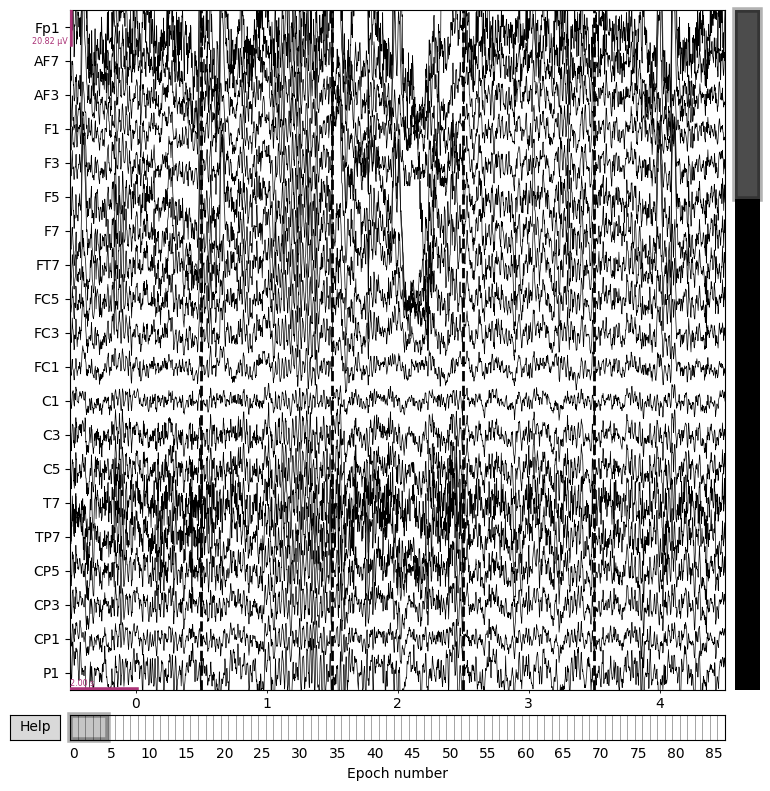

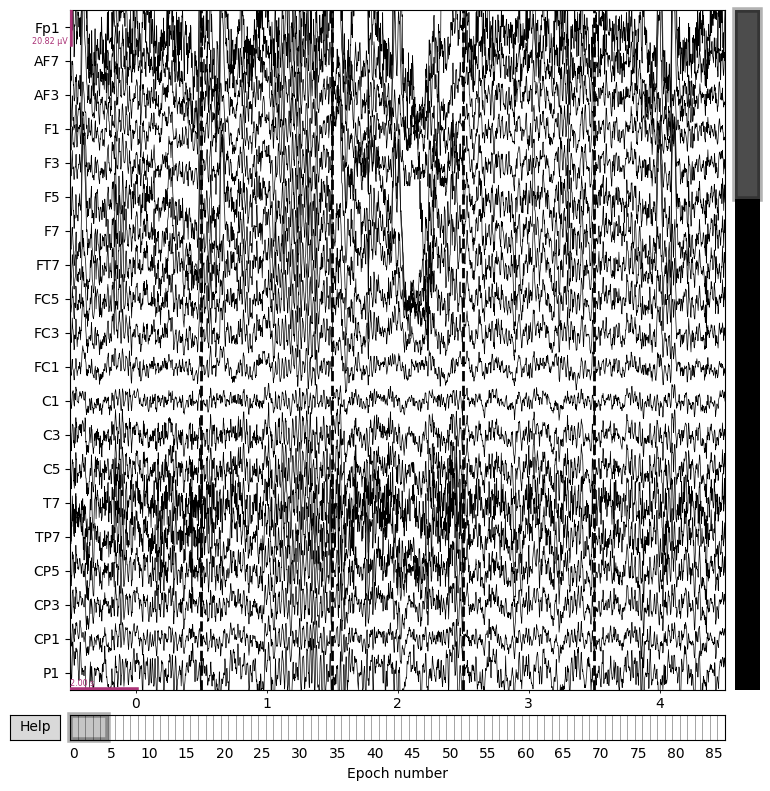

In [ ]:
# Plot the first few epochs (average reference applied)
epochs.plot(n_epochs=5, scalings='auto')


In [ ]:
# Get a count of events
event_counts = epochs.event_id
print("Event Counts:", event_counts)

# Visualize event counts
epochs.plot_events()


Event Counts: {'1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8}


AttributeError: 'EpochsFIF' object has no attribute 'plot_events'

# Preprocessing from Raw Data

Processing sub-01...
Step 1: Loading raw EEG data
Extracting EDF parameters from /content/drive/MyDrive/ds004196/sub-01/ses-EEG/eeg/sub-01_ses-EEG_task-inner_eeg.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 696319  =      0.000 ...  1359.998 secs...
Step 2: Applying high-pass filter (1 Hz)
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Step 3: Applying notch filter (50 Hz)
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Step 4: Re-referencing to common average
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Step 5: Resampling to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.9s


966 events found on stim channel Status
Event IDs: [    1     2   111   112   113   114   125   126   127   128 65536]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
966 events found on stim channel Status
Event IDs: [    1     2   111   112   113   114   125   126   127   128 65536]
Step 6: Performing ICA for artifact removal
Fitting ICA to data using 72 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 34.0s.
Saving ICA components to /content/drive/MyDrive/eeg_preprocessed_v1/sub-01_ica.fif
Writing ICA solution to /content/drive/MyDrive/eeg_preprocessed_v1/sub-01_ica.fif...
Saving preprocessed data to /content/drive/MyDrive/eeg_preprocessed_v1/sub-01_preprocessed_raw.fif
Writing /content/drive/MyDrive/eeg_preprocessed_v1/sub-01_preprocessed_raw.fif
Closing /content/drive/MyDrive/eeg_preprocessed_v

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Step 3: Applying notch filter (50 Hz)
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.8s


Step 4: Re-referencing to common average
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Step 5: Resampling to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
960 events found on stim channel Status


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    3.7s


Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
960 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Performing ICA for artifact removal
Fitting ICA to data using 72 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 19.2s.
Saving ICA components to /content/drive/MyDrive/eeg_preprocessed_v1/sub-02_ica.fif
Writing ICA solution to /content/drive/MyDrive/eeg_preprocessed_v1/sub-02_ica.fif...
Saving preprocessed data to /content/drive/MyDrive/eeg_preprocessed_v1/sub-02_preprocessed_raw.fif
Writing /content/drive/MyDrive/eeg_preprocessed_v1/sub-02_preprocessed_raw.fif
Closing /content/drive/MyDrive/eeg_preprocessed_v1/sub-02_preprocessed_raw.fif
[done]
Processing sub-03...
Step 1: Loading raw EEG data
Extra

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


Step 3: Applying notch filter (50 Hz)
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


Step 4: Re-referencing to common average
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Step 5: Resampling to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
959 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.5s


Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
959 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Performing ICA for artifact removal
Fitting ICA to data using 72 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 20.3s.
Saving ICA components to /content/drive/MyDrive/eeg_preprocessed_v1/sub-03_ica.fif
Writing ICA solution to /content/drive/MyDrive/eeg_preprocessed_v1/sub-03_ica.fif...
Saving preprocessed data to /content/drive/MyDrive/eeg_preprocessed_v1/sub-03_preprocessed_raw.fif
Writing /content/drive/MyDrive/eeg_preprocessed_v1/sub-03_preprocessed_raw.fif
Closing /content/drive/MyDrive/eeg_preprocessed_v1/sub-03_preprocessed_raw.fif
[done]
Processing sub-05...
Step 1: Loading raw EEG data
Extracting EDF parameters from /content/drive/MyDrive/ds00

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Step 3: Applying notch filter (50 Hz)
Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Step 4: Re-referencing to common average
EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Step 5: Resampling to 256 Hz
Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
961 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]


[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    2.6s


Trigger channel Status has a non-zero initial value of {initial_value} (consider using initial_event=True to detect this event)
Removing orphaned offset at the beginning of the file.
961 events found on stim channel Status
Event IDs: [  1   2 111 112 113 114 125 126 127 128]
Step 6: Performing ICA for artifact removal
Fitting ICA to data using 72 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 20.6s.
Saving ICA components to /content/drive/MyDrive/eeg_preprocessed_v1/sub-05_ica.fif
Writing ICA solution to /content/drive/MyDrive/eeg_preprocessed_v1/sub-05_ica.fif...
Saving preprocessed data to /content/drive/MyDrive/eeg_preprocessed_v1/sub-05_preprocessed_raw.fif
Writing /content/drive/MyDrive/eeg_preprocessed_v1/sub-05_preprocessed_raw.fif
Closing /content/drive/MyDrive/eeg_preprocessed_v1/sub-05_preprocessed_raw.fif
[done]
Preprocessing completed for all subjects.
Visualizing one subject's preprocessed data and ICA components...


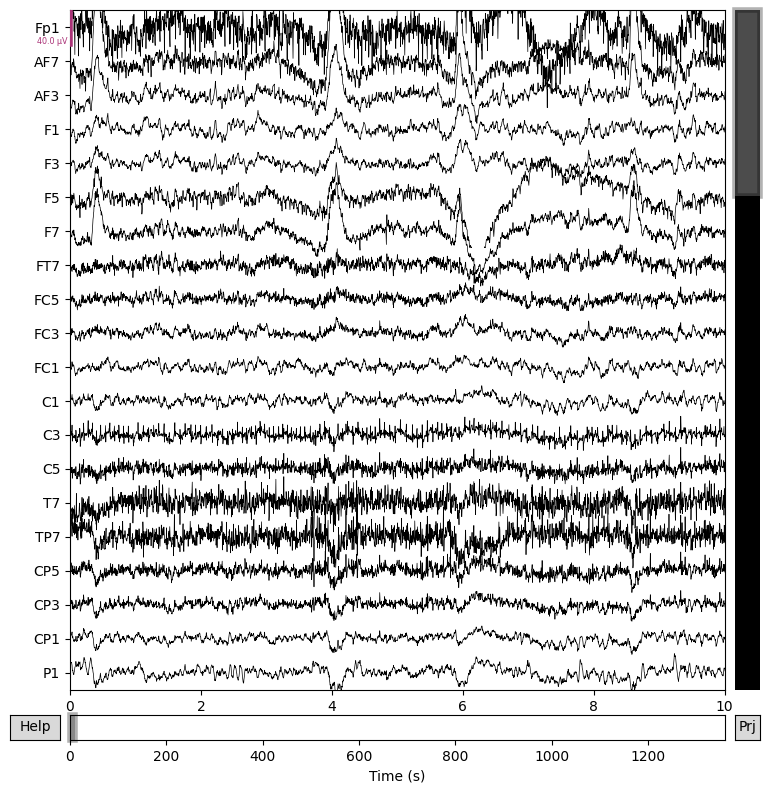

Plotting ICA components...


RuntimeError: No digitization points found.

In [ ]:
import os
import mne
from mne.preprocessing import ICA
from mne.io import read_raw_bdf

# Define paths
data_dir = "/content/drive/MyDrive/ds004196"
output_dir = "/content/drive/MyDrive/eeg_preprocessed_v1"
os.makedirs(output_dir, exist_ok=True)  # Create output folder if it doesn't exist

# Subject IDs
subjects = ["sub-01", "sub-02", "sub-03", "sub-05"]

# Preprocessing pipeline for each subject
for subject in subjects:
    print(f"Processing {subject}...")

    # Step 1: Load raw EEG data
    print("Step 1: Loading raw EEG data")
    bdf_path = os.path.join(data_dir, subject, "ses-EEG", "eeg", f"{subject}_ses-EEG_task-inner_eeg.bdf")
    raw = read_raw_bdf(bdf_path, preload=True)

    # Step 2: Apply high-pass filter (1 Hz)
    print("Step 2: Applying high-pass filter (1 Hz)")
    raw.filter(l_freq=1., h_freq=None)

    # Step 3: Apply notch filter (50 Hz)
    print("Step 3: Applying notch filter (50 Hz)")
    raw.notch_filter(freqs=50)

    # Step 4: Re-reference to average reference
    print("Step 4: Re-referencing to common average")
    raw.set_eeg_reference('average', projection=True)

    # Step 5: Resampling to 256 Hz
    print("Step 5: Resampling to 256 Hz")
    raw.resample(256)

    # Step 6: ICA for artifact removal
    print("Step 6: Performing ICA for artifact removal")
    ica = ICA(n_components=20, random_state=42, max_iter="auto")
    ica.fit(raw)
    # Save ICA components
    ica_save_path = os.path.join(output_dir, f"{subject}_ica.fif")
    print(f"Saving ICA components to {ica_save_path}")
    ica.save(ica_save_path)

    # Step 7: Save the preprocessed raw EEG data
    preprocessed_path = os.path.join(output_dir, f"{subject}_preprocessed_raw.fif")
    print(f"Saving preprocessed data to {preprocessed_path}")
    raw.save(preprocessed_path, overwrite=True)

print("Preprocessing completed for all subjects.")

# Visualize preprocessed data and ICA components
print("Visualizing one subject's preprocessed data and ICA components...")
subject = subjects[0]
preprocessed_path = os.path.join(output_dir, f"{subject}_preprocessed_raw.fif")
ica_path = os.path.join(output_dir, f"{subject}_ica.fif")

# Load preprocessed raw data and ICA
raw = mne.io.read_raw_fif(preprocessed_path, preload=True)
ica = mne.preprocessing.read_ica(ica_path)

# Plot raw preprocessed data
print("Plotting preprocessed data...")
raw.plot()

# Plot ICA components
print("Plotting ICA components...")
ica.plot_components(inst=raw)


# Prprocess from set file

sampling frequency,
1. bandpass filtering
2. re-referencing


3. ICA Decomposition/remove artifacts such as:
    Eye blinks.
    Muscle activity.
    Cardiac artifacts.
4. annotate

In [ ]:
import os
import mne

# Define paths
base_path = "/content/drive/MyDrive/ds004196"
output_path = os.path.join(base_path, "eeg_preprocessed_v2")

# Create output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Function to preprocess and save data
def preprocess_eeg(set_file, save_path):
    # Load the EEG data
    raw = mne.io.read_raw_eeglab(set_file, preload=True)

    # Apply a bandpass filter
    raw.filter(l_freq=1, h_freq=40)

    # Re-reference to the common average
    raw.set_eeg_reference('average', projection=True)

    # Save the preprocessed data
    output_file = os.path.join(save_path, os.path.basename(set_file).replace('.set', '_preprocessed.fif'))
    raw.save(output_file, overwrite=True)
    print(f"Processed and saved: {output_file}")

# Iterate through the folder structure and preprocess EEG files
for root, dirs, files in os.walk(base_path):
    for file in files:
        if file.endswith('.set'):
            set_file_path = os.path.join(root, file)
            preprocess_eeg(set_file_path, output_path)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: Limited 4 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Writing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif


<ipython-input-4-764e8af3d7b3>:24: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(output_file, overwrite=True)


Closing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif
[done]
Processed and saved: /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.1s


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Writing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif


<ipython-input-4-764e8af3d7b3>:24: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(output_file, overwrite=True)


Closing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif
[done]
Processed and saved: /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: Limited 3 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Writing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif


<ipython-input-4-764e8af3d7b3>:24: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(output_file, overwrite=True)


Closing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif
[done]
Processed and saved: /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: Limited 2 annotation(s) that were expanding outside the data range.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
<ipython-input-4-764e8af3d7b3>:14: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
  raw = mne.io.read_raw_eeglab(set_file, preload=True)
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


EEG channel type selected for re-referencing
Adding average EEG reference projection.
1 projection items deactivated
Average reference projection was added, but has not been applied yet. Use the apply_proj method to apply it.
Writing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif


<ipython-input-4-764e8af3d7b3>:24: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw.save(output_file, overwrite=True)


Closing /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif
[done]
Processed and saved: /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif


Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-18-f22c7300561c>:10: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fif_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 57)  idle
    Range : 0 ... 650320 =      0.000 ...  1270.156 secs
Ready.
Reading 0 ... 650320  =      0.000 ...  1270.156 secs...
<Info | 11 non-empty values
 bads: []
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 57 EEG
 custom_ref_applied: False
 dig: 60 items (3 Cardinal, 57 EEG)
 file_id: 4 items (dict)
 highpass: 1.0 Hz
 lowpass: 40.0 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 57
 projs: Average EEG reference: off
 sfreq: 512.0 Hz
>


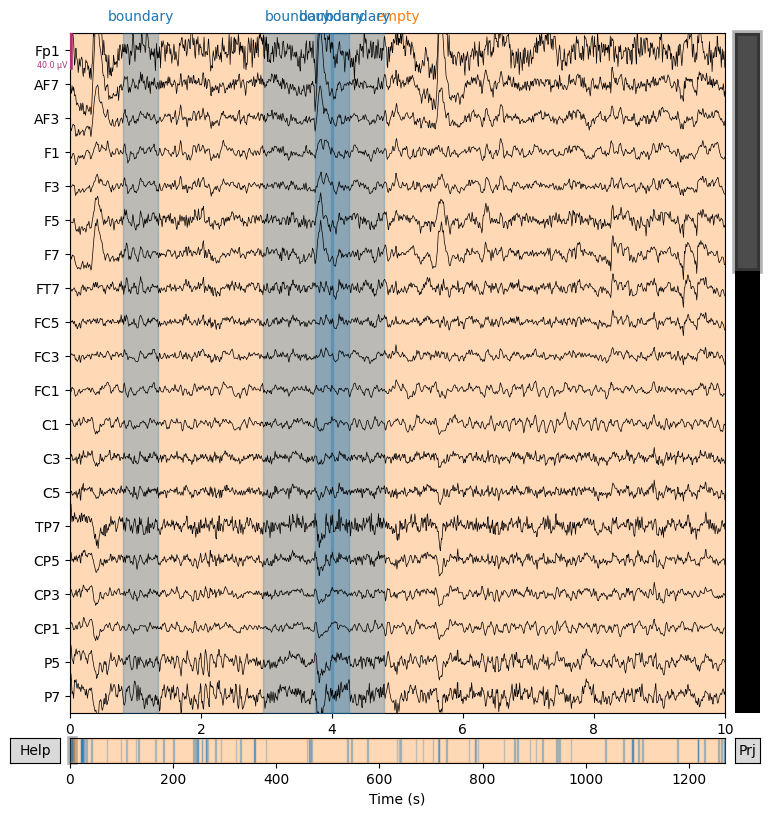

In [ ]:
import mne
import os

# Specify the path to a preprocessed .fif file
fif_file = "/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif"  # Update this to your target file

# Check if the file exists
if os.path.exists(fif_file):
    # Load the preprocessed EEG data
    raw = mne.io.read_raw_fif(fif_file, preload=True)

    # Display basic information about the dataset
    print(raw.info)

    # Plot the raw data
    raw.plot(title="Preprocessed EEG Signal", duration=10, n_channels=20)  # Adjust duration and n_channels as needed
else:
    print(f"File not found: {fif_file}")


In [ ]:
import os
import pandas as pd
import mne

trainable_dir = "/content/drive/MyDrive/ds004196/trainable"
os.makedirs(trainable_dir, exist_ok=True)


# Define paths
base_dir = "/content/drive/MyDrive/ds004196/"
preprocessed_dir = os.path.join(base_dir, "eeg_preprocessed_v2")
subjects = ["sub-01", "sub-02", "sub-03", "sub-05"]

# Function to load events and preprocessed data
def load_data(subject):
    # Load preprocessed EEG data
    eeg_file = os.path.join(preprocessed_dir, f"{subject}_ses-EEG_task-inner_eeg_preprocessed.fif")
    raw = mne.io.read_raw_fif(eeg_file, preload=True)

    # Load events.tsv
    events_file = os.path.join(base_dir, subject, "ses-EEG", "eeg", f"{subject}_ses-EEG_task-inner_events.tsv")
    events_df = pd.read_csv(events_file, sep="\t")
    return raw, events_df



def segment_signal(raw, events_df, subject, trainable_dir):
    signal_segments = []
    for _, event in events_df.iterrows():
        onset_sec = event["onset"] / 1000  # Convert from ms to seconds
        duration_sec = event["duration"] / 1000
        label = event["trial_type"]

        # Extract the signal portion
        start_sample = int(onset_sec * raw.info["sfreq"])
        end_sample = int((onset_sec + duration_sec) * raw.info["sfreq"])
        signal_segment = raw.get_data(start=start_sample, stop=end_sample)

        # Append to list as (signal, label)
        signal_segments.append({"signal": signal_segment, "label": label})

    # Save the signals and labels in a CSV file
    output_file = os.path.join(trainable_dir, f"{subject}_segments.csv")
    pd.DataFrame(signal_segments).to_csv(output_file, index=False)
    print(f"Saved segments for {subject} to {output_file}")




for subject in subjects:
    raw, events_df = load_data(subject)
    segment_signal(raw, events_df, subject, trainable_dir)


Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-25-e3af56ad996d>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 57)  idle
    Range : 0 ... 650320 =      0.000 ...  1270.156 secs
Ready.
Reading 0 ... 650320  =      0.000 ...  1270.156 secs...
Saved segments for sub-01 to /content/drive/MyDrive/ds004196/trainable/sub-01_segments.csv
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-25-e3af56ad996d>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 54)  idle
    Range : 0 ... 607503 =      0.000 ...  1186.529 secs
Ready.
Reading 0 ... 607503  =      0.000 ...  1186.529 secs...
Saved segments for sub-02 to /content/drive/MyDrive/ds004196/trainable/sub-02_segments.csv
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-25-e3af56ad996d>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 59)  idle
    Range : 0 ... 656767 =      0.000 ...  1282.748 secs
Ready.
Reading 0 ... 656767  =      0.000 ...  1282.748 secs...
Saved segments for sub-03 to /content/drive/MyDrive/ds004196/trainable/sub-03_segments.csv
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-25-e3af56ad996d>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 59)  idle
    Range : 0 ... 595430 =      0.000 ...  1162.949 secs
Ready.
Reading 0 ... 595430  =      0.000 ...  1162.949 secs...
Saved segments for sub-05 to /content/drive/MyDrive/ds004196/trainable/sub-05_segments.csv


pckl

In [ ]:
import os
import pandas as pd
import mne
import pickle

trainable_dir = "/content/drive/MyDrive/ds004196/trainable"
os.makedirs(trainable_dir, exist_ok=True)

# Define paths
base_dir = "/content/drive/MyDrive/ds004196/"
preprocessed_dir = os.path.join(base_dir, "eeg_preprocessed_v2")
subjects = ["sub-01", "sub-02", "sub-03", "sub-05"]

# Function to load events and preprocessed data
def load_data(subject):
    # Load preprocessed EEG data
    eeg_file = os.path.join(preprocessed_dir, f"{subject}_ses-EEG_task-inner_eeg_preprocessed.fif")
    raw = mne.io.read_raw_fif(eeg_file, preload=True)

    # Load events.tsv
    events_file = os.path.join(base_dir, subject, "ses-EEG", "eeg", f"{subject}_ses-EEG_task-inner_events.tsv")
    events_df = pd.read_csv(events_file, sep="\t")
    return raw, events_df

# Function to segment signal and save using Pickle
def segment_signal(raw, events_df, subject, trainable_dir):
    signal_segments = []
    for _, event in events_df.iterrows():
        onset_sec = event["onset"] / 1000  # Convert from ms to seconds
        duration_sec = event["duration"] / 1000
        label = event["trial_type"]

        # Extract the signal portion
        start_sample = int(onset_sec * raw.info["sfreq"])
        end_sample = int((onset_sec + duration_sec) * raw.info["sfreq"])
        signal_segment = raw.get_data(start=start_sample, stop=end_sample)

        # Append to list as dictionary
        signal_segments.append({"signal": signal_segment, "label": label})

    # Save the segments to a Pickle file
    output_file = os.path.join(trainable_dir, f"{subject}_segments.pkl")
    with open(output_file, "wb") as f:
        pickle.dump(signal_segments, f)
    print(f"Saved segments for {subject} to {output_file}")

# Process each subject
for subject in subjects:
    raw, events_df = load_data(subject)
    segment_signal(raw, events_df, subject, trainable_dir)


Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-40-2482422a6ddd>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-01_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 57)  idle
    Range : 0 ... 650320 =      0.000 ...  1270.156 secs
Ready.
Reading 0 ... 650320  =      0.000 ...  1270.156 secs...
Saved segments for sub-01 to /content/drive/MyDrive/ds004196/trainable/sub-01_segments.pkl
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-40-2482422a6ddd>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-02_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 54)  idle
    Range : 0 ... 607503 =      0.000 ...  1186.529 secs
Ready.
Reading 0 ... 607503  =      0.000 ...  1186.529 secs...
Saved segments for sub-02 to /content/drive/MyDrive/ds004196/trainable/sub-02_segments.pkl
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-40-2482422a6ddd>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-03_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 59)  idle
    Range : 0 ... 656767 =      0.000 ...  1282.748 secs
Ready.
Reading 0 ... 656767  =      0.000 ...  1282.748 secs...
Saved segments for sub-03 to /content/drive/MyDrive/ds004196/trainable/sub-03_segments.pkl
Opening raw data file /content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif...


<ipython-input-40-2482422a6ddd>:18: RuntimeWarning: This filename (/content/drive/MyDrive/ds004196/eeg_preprocessed_v2/sub-05_ses-EEG_task-inner_eeg_preprocessed.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(eeg_file, preload=True)


    Read a total of 1 projection items:
        Average EEG reference (1 x 59)  idle
    Range : 0 ... 595430 =      0.000 ...  1162.949 secs
Ready.
Reading 0 ... 595430  =      0.000 ...  1162.949 secs...
Saved segments for sub-05 to /content/drive/MyDrive/ds004196/trainable/sub-05_segments.pkl


In [ ]:
with open("/content/drive/MyDrive/ds004196/trainable/sub-01_segments.pkl", "rb") as f:
    signal_segments = pickle.load(f)

# Example: Access the first segment
first_segment = signal_segments[0]
signal_data = first_segment["signal"]
label = first_segment["label"]


print(f"Signal Data Shape: {signal_data.shape}")
print(f"Label: {label}")



Signal Data Shape: (57, 2047)
Label: six


In [ ]:
import os
import pickle

# Define the directory containing the .pkl files
directory = "/content/drive/MyDrive/ds004196/trainable/"

# Loop through all .pkl files in the directory
for file_name in os.listdir(directory):
    if file_name.endswith("_segments.pkl"):  # Check if the file is a .pkl file
        subject_path = os.path.join(directory, file_name)

        # Load the .pkl file
        with open(subject_path, "rb") as f:
            signal_segments = pickle.load(f)

        print(f"\nProcessing file: {file_name}")
        for i, segment in enumerate(signal_segments):
            signal_data = segment["signal"]
            label = segment["label"]

            # Print details for each segment
            print(f"  Segment {i+1}:")
            print(f"    Signal Data Shape: {signal_data.shape}")
            print(f"    Label: {label}")

        print(f"Finished processing {file_name}.\n")



Processing file: sub-01_segments.pkl
  Segment 1:
    Signal Data Shape: (57, 2047)
    Label: six
  Segment 2:
    Signal Data Shape: (57, 2048)
    Label: six
  Segment 3:
    Signal Data Shape: (57, 2048)
    Label: four
  Segment 4:
    Signal Data Shape: (57, 2048)
    Label: ten
  Segment 5:
    Signal Data Shape: (57, 2048)
    Label: four
  Segment 6:
    Signal Data Shape: (57, 2048)
    Label: ten
  Segment 7:
    Signal Data Shape: (57, 2048)
    Label: wife
  Segment 8:
    Signal Data Shape: (57, 2048)
    Label: three
  Segment 9:
    Signal Data Shape: (57, 2048)
    Label: wife
  Segment 10:
    Signal Data Shape: (57, 2048)
    Label: wife
  Segment 11:
    Signal Data Shape: (57, 2048)
    Label: child
  Segment 12:
    Signal Data Shape: (57, 2048)
    Label: four
  Segment 13:
    Signal Data Shape: (57, 2048)
    Label: father
  Segment 14:
    Signal Data Shape: (57, 2048)
    Label: ten
  Segment 15:
    Signal Data Shape: (57, 2048)
    Label: daughter
  Segmen

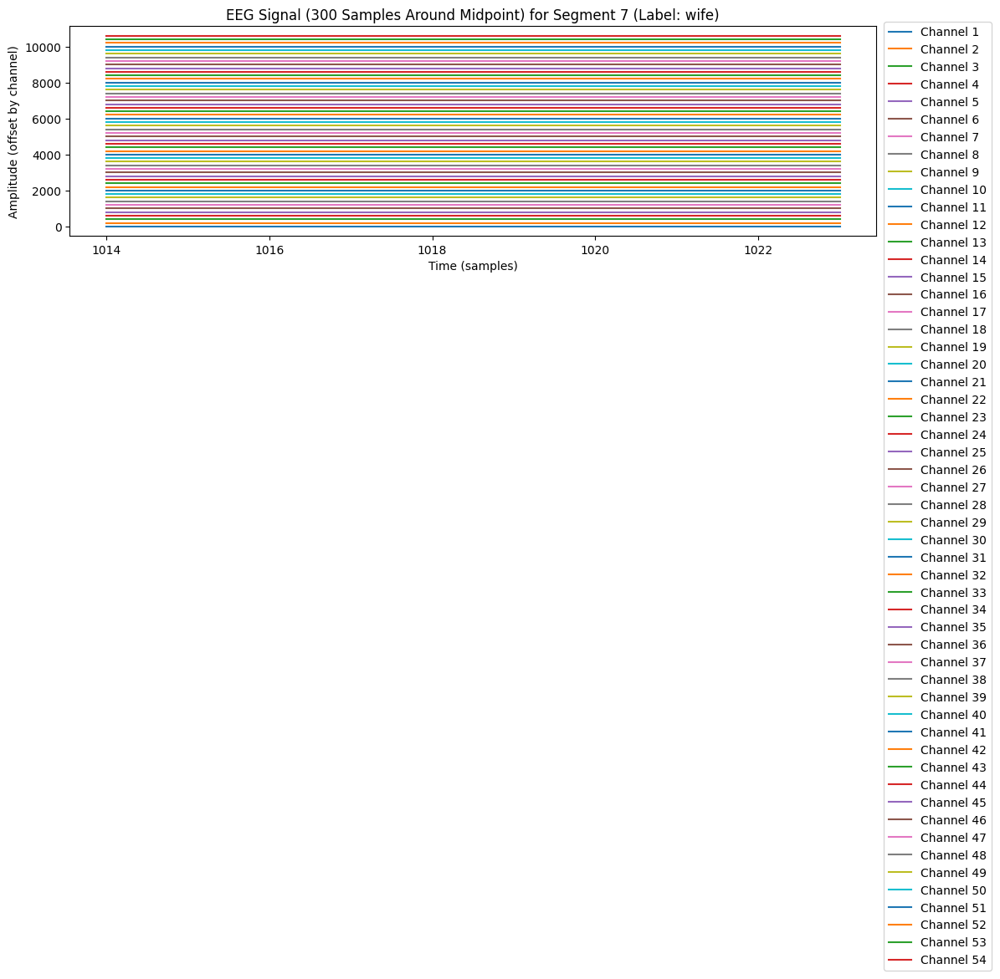

In [ ]:
import os
import pickle
import matplotlib.pyplot as plt

# Define the directory containing the .pkl files
directory = "/content/drive/MyDrive/ds004196/trainable/"
subject_file = "sub-02_segments.pkl"  # Specify the subject file

# Load the .pkl file
subject_path = os.path.join(directory, subject_file)
with open(subject_path, "rb") as f:
    signal_segments = pickle.load(f)

# Select segment 7 (index 6 because indexing starts at 0)
segment_index = 6
selected_segment = signal_segments[segment_index]
signal_data = selected_segment["signal"]
label = selected_segment["label"]

# Define the range of samples to display
total_samples = signal_data.shape[1]
mid_point = total_samples // 2
start_sample = max(0, mid_point - 10)
end_sample = min(total_samples, mid_point + 0)

# Plot the signal for all channels in the specified range
plt.figure(figsize=(12, 8))
for i, channel_signal in enumerate(signal_data):
    plt.plot(
        range(start_sample, end_sample),
        channel_signal[start_sample:end_sample] + i * 200,  # Offset for better visibility
        label=f"Channel {i+1}",
    )

plt.title(f"EEG Signal (300 Samples Around Midpoint) for Segment {segment_index+1} (Label: {label})")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude (offset by channel)")
plt.legend(loc="upper right", bbox_to_anchor=(1.15, 1.05))
plt.tight_layout()
plt.show()


In [ ]:
import os
import pickle
import matplotlib.pyplot as plt

# Define the directory containing the .pkl files
directory = "/content/drive/MyDrive/ds004196/trainable/"
subject_file = "sub-02_segments.pkl"  # Specify the subject file

# Load the .pkl file
subject_path = os.path.join(directory, subject_file)
with open(subject_path, "rb") as f:
    signal_segments = pickle.load(f)

# Select segment 7 (index 6 because indexing starts at 0)
segment_index = 6
selected_segment = signal_segments[segment_index]
signal_data = selected_segment["signal"]
label = selected_segment["label"]

# Convert time range to sample range
sfreq = 250  # Assuming a sampling frequency of 250 Hz
start_sample = 0
end_sample = int(0.2 * sfreq)  # 200 ms corresponds to 200 ms * sfreq



In [ ]:
selected_segment["signal"].shape

(54, 2048)

(2048,)


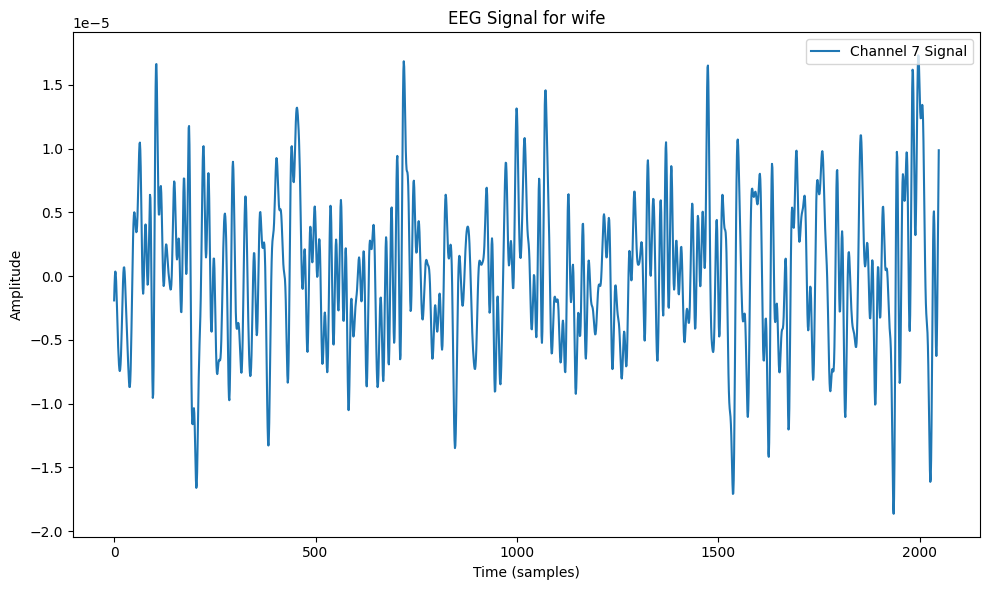

In [ ]:
import matplotlib.pyplot as plt

# Extract the signal data
signal_data = selected_segment["signal"][7]
print(signal_data.shape)

# Plot the signal
plt.figure(figsize=(10, 6))
plt.plot(signal_data, label="Channel 7 Signal")  # You can rename the label as appropriate

# Add title and labels
plt.title("EEG Signal for "+selected_segment["label"])
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")

# Add a legend
plt.legend(loc="upper right")

# Show the plot
plt.tight_layout()
plt.show()




---
Issue Found that subject1 have 57 channels, sub2: 54, sub3: 59, sub5:59 after the some channels removed on preprocess.

---



In [ ]:
import os
import mne

# Define the file paths for the .set files
subjects = {
    "sub-01": "/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set",
    "sub-02": "/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set",
    "sub-03": "/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set",
    "sub-05": "/content/drive/MyDrive/ds004196/sub-05/ses-EEG/eeg/sub-05_ses-EEG_task-inner_eeg.set",
}

# Dictionary to store channel names for each subject
subject_channels = {}

# Extract channel names for each subject
for subject, file_path in subjects.items():
    # Load the raw data using MNE
    raw = mne.io.read_raw_eeglab(file_path, preload=False)
    # Get the channel names
    subject_channels[subject] = set(raw.info['ch_names'])
    print(f"{subject} channels: {subject_channels[subject]}")

# Find common and uncommon channels
all_channels = set.union(*subject_channels.values())  # Union of all channels
common_channels = set.intersection(*subject_channels.values())  # Intersection of all channels
uncommon_channels = all_channels - common_channels  # Channels not common across all subjects

# Print results
print("\nCommon Channels across all subjects:")
print(common_channels)

print("\nUncommon Channels across subjects:")
for subject, channels in subject_channels.items():
    unique_to_subject = channels - common_channels
    print(f"Channels unique to {subject}: {unique_to_subject}")
